In [2]:
# cv2: OpenCV 라이브러리로, 실시간 컴퓨터 비전을 목적으로 한 프로그래밍 라이브러리
# numpy(NumPy): 행렬이나 대규모 다차원 배열을 쉽게 처리할 수 있도록 지원하는 라이브러리. 데이터 구조 외에도 수치 계산을 위해 효율적으로 구현된 기능을 제공
# torch: PyTorch. 딥러닝 및 텐서 연산을 위한 라이브러리. 인공지능 모델을 만들거나 불러와 추론하는 도구
# torchvision: 이미지 변환 및 전처리를 위한 torchvision의 transform 모듈
# deeplabv3_resnet101: 사전 학습된 DeepLabV3 모델. 이미지를 분류하도록 학습된 모델
# matplotlib: 파이썬 프로그래밍 언어 및 수학적 확장 NumPy 라이브러리를 활용한 플로팅 라이브러리로, 데이터 시각화 도구
!pip install opencv-python

import cv2
import os
import numpy as np
import torch
import torchvision.transforms as T
from torchvision.models.segmentation import deeplabv3_resnet101
import matplotlib.pyplot as plt


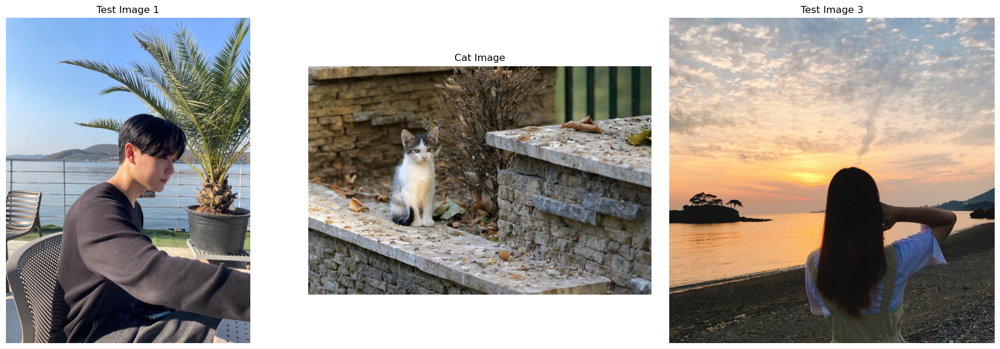

In [15]:
home_dir  = os.getenv('HOME')
img_path  = os.path.join(home_dir, "work/human_segmentation/images/test_img.jpg")
img_path2 = os.path.join(home_dir, "work/human_segmentation/images/cat.jpg")
img_path3 = os.path.join(home_dir, "work/human_segmentation/images/test_img3.jpg")

img_orig  = cv2.imread(img_path)
img_orig2 = cv2.imread(img_path2)
img_orig3 = cv2.imread(img_path3)

# 1행 3열 figure/axes 생성 (가로 길이를 늘려서 여유 있게)
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# 첫 번째 이미지
axs[0].imshow(cv2.cvtColor(img_orig,  cv2.COLOR_BGR2RGB))
axs[0].set_title("Test Image 1")
axs[0].axis('off')

# 두 번째 이미지
axs[1].imshow(cv2.cvtColor(img_orig2, cv2.COLOR_BGR2RGB))
axs[1].set_title("Cat Image")
axs[1].axis('off')

# 세 번째 이미지
axs[2].imshow(cv2.cvtColor(img_orig3, cv2.COLOR_BGR2RGB))
axs[2].set_title("Test Image 3")
axs[2].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# 모델 다운로드 (Torchvision)

In [10]:
model = deeplabv3_resnet101(pretrained=True).eval()

In [ ]:
# 이미지 전처리

In [19]:
# 1) Transform 정의
transform = T.Compose([
    T.ToPILImage(),
    T.Resize((520, 520)),  # 모델 입력 크기 (고정)
    T.ToTensor(),
])

# 2) 원본 이미지 로드
home_dir  = os.getenv('HOME')
paths     = [
    os.path.join(home_dir, "work/human_segmentation/images/test_img.jpg"),
    os.path.join(home_dir, "work/human_segmentation/images/cat.jpg"),
    os.path.join(home_dir, "work/human_segmentation/images/test_img3.jpg"),
]
orig_imgs = [cv2.imread(p) for p in paths]

# 3) 배치 텐서 생성
#    - 각 이미지를 BGR→RGB 변환 후 transform
#    - transform 결과: [C, H, W]
#    - stack → [batch=3, C, H, W]
batch_tensor = torch.stack([
    transform(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    for img in orig_imgs
], dim=0)

# 4) 모델 추론
model.eval()
with torch.no_grad():
    # model 출력을 받으면 shape: [3, num_classes, 520, 520]
    outs = model(batch_tensor)["out"]

# 5) 각 출력에 대해 argmax → 원-핫 예측 맵, 그리고 원본 크기로 리사이즈
preds_resized = []
for i, out in enumerate(outs):
    # out: [num_classes, 520, 520]
    pred = out.argmax(0).byte().cpu().numpy()  # [520, 520]
    h, w = orig_imgs[i].shape[:2]
    pred_resized = cv2.resize(
        pred,
        (w, h),
        interpolation=cv2.INTER_NEAREST
    )
    preds_resized.append(pred_resized)

# preds_resized 에는 각각 원본 크기로 리사이즈된 세 장의 예측 맵이 담겨 있습니다.
# 이후 시각화나 저장은 preds_resized 리스트를 순회하며 진행하세요.


In [17]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

In [ ]:
# pasclvoc 데이터 라벨은 background를 제외한 20개이다

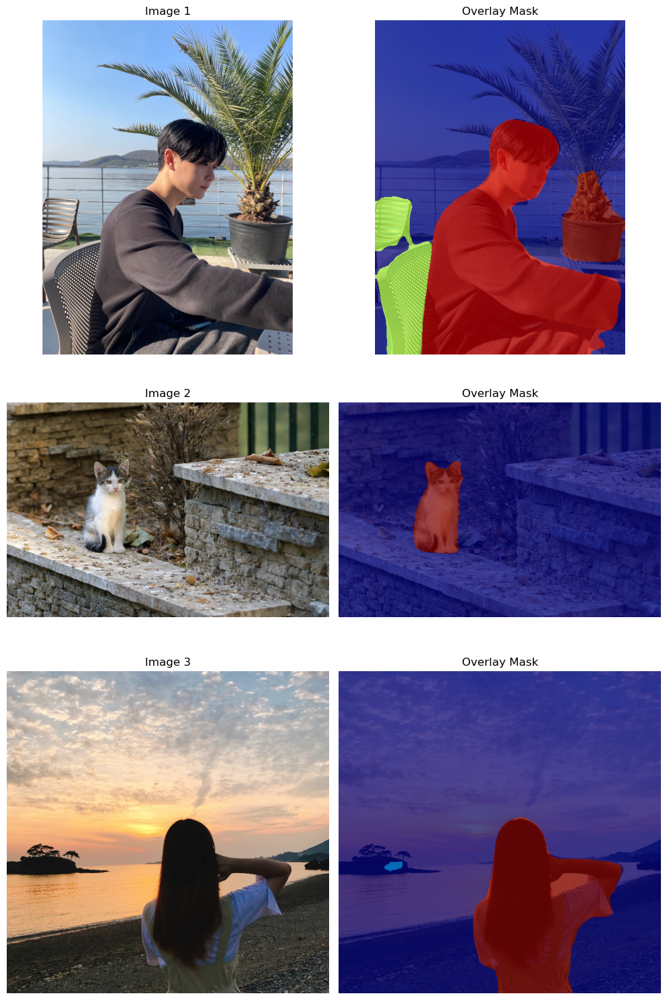

In [20]:
n = len(orig_imgs)  # 여기서는 3
fig, axs = plt.subplots(n, 2, figsize=(10, 5*n))

for i in range(n):
    # 1) 원본 이미지
    axs[i, 0].imshow(cv2.cvtColor(orig_imgs[i], cv2.COLOR_BGR2RGB))
    axs[i, 0].set_title(f"Image {i+1}")
    axs[i, 0].axis('off')
    
    # 2) 마스크 오버레이
    axs[i, 1].imshow(cv2.cvtColor(orig_imgs[i], cv2.COLOR_BGR2RGB))
    axs[i, 1].imshow(preds_resized[i], cmap="jet", alpha=0.7)
    axs[i, 1].set_title("Overlay Mask")
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# 1번 이미지는 사람, 의자, 화분
# 2번 이미지는 고양이
# 3번 이미지는 보트

In [24]:
unique_classes_per_image = [np.unique(mask) for mask in preds_resized]

for i, classes in enumerate(unique_classes_per_image, start=1):
    print(f"Image {i} unique classes: {classes}")

Image 1 unique classes: [ 0  9 15 16]
Image 2 unique classes: [0 8]
Image 3 unique classes: [ 0  4 15]


In [15]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생성 코드 결과물이예요!

#컬러맵 만들기
colormap = np.zeros((256, 3), dtype=int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]  # 생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [ ]:
# 1 ~ 20개의 개체별 컬러맵

In [16]:
colormap[15] #컬러맵 15에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 15번째인 사람)

array([192, 128, 128])

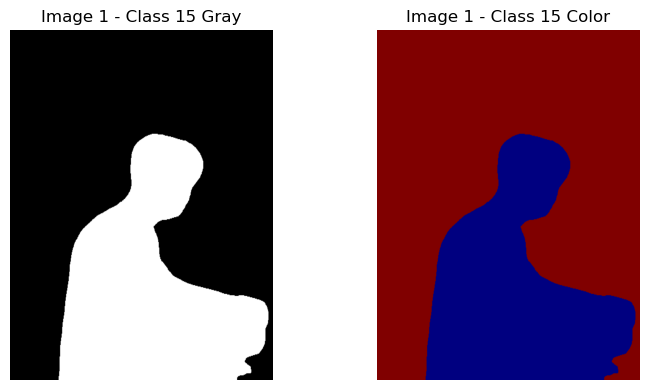

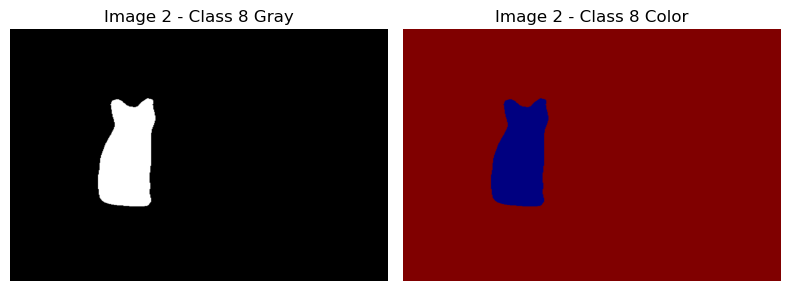

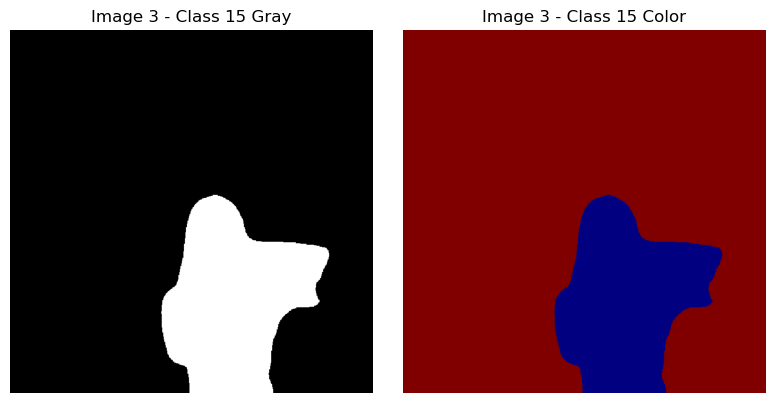

In [26]:
# preds_resized: 앞서 만든 [mask_img1, mask_img2, mask_img3] 리스트
# 이미지 1,2,3에 대해 사용할 클래스 ID
class_ids = [15, 8, 15]  # 1번(person=15), 2번(cat=8), 3번(person=15)

for idx, (mask, class_id) in enumerate(zip(preds_resized, class_ids), start=1):
    # 1) 해당 클래스만 True
    seg_map = (mask == class_id)

    # 2) 0/1 → 0/255 (uint8)
    img_mask = seg_map.astype(np.uint8) * 255

    # 3) 컬러맵
    color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

    # 4) 시각화 (흑백 + 컬러맵)
    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    axs[0].imshow(img_mask, cmap='gray')
    axs[0].set_title(f'Image {idx} - Class {class_id} Gray')
    axs[0].axis('off')

    axs[1].imshow(color_mask)
    axs[1].set_title(f'Image {idx} - Class {class_id} Color')
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()


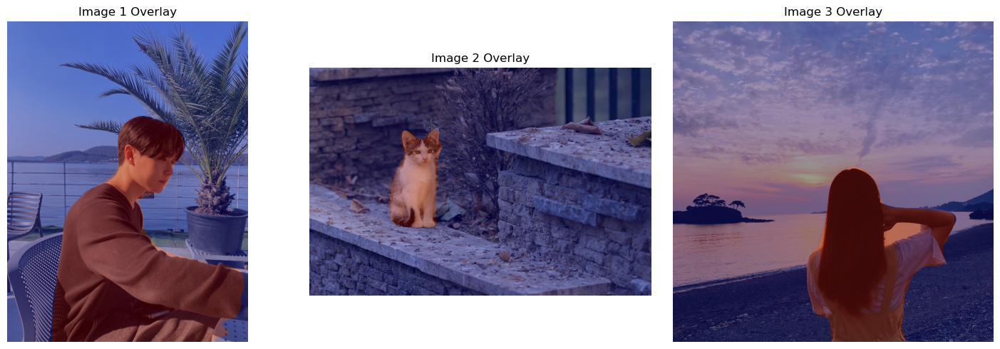

In [27]:
color_masks = []
for mask, class_id in zip(preds_resized, class_ids):
    # 2-1) 이진 마스크 (0/255)
    img_mask = (mask == class_id).astype(np.uint8) * 255
    # 2-2) 컬러맵 (BGR)
    color_map = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
    color_masks.append(color_map)

# 3) 합성 & 시각화
n = len(orig_imgs)  # 3
fig, axs = plt.subplots(1, n, figsize=(5*n, 5))

for i, (orig, cmap) in enumerate(zip(orig_imgs, color_masks), start=1):
    # 3-1) addWeighted로 섞기 (0.6:원본, 0.4:마스크)
    img_show = cv2.addWeighted(orig, 0.6, cmap, 0.4, 0.0)
    
    # 3-2) Matplotlib에 맞게 RGB로 변환 후 출력
    axs[i-1].imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
    axs[i-1].set_title(f"Image {i} Overlay")
    axs[i-1].axis('off')

plt.tight_layout()
plt.show()

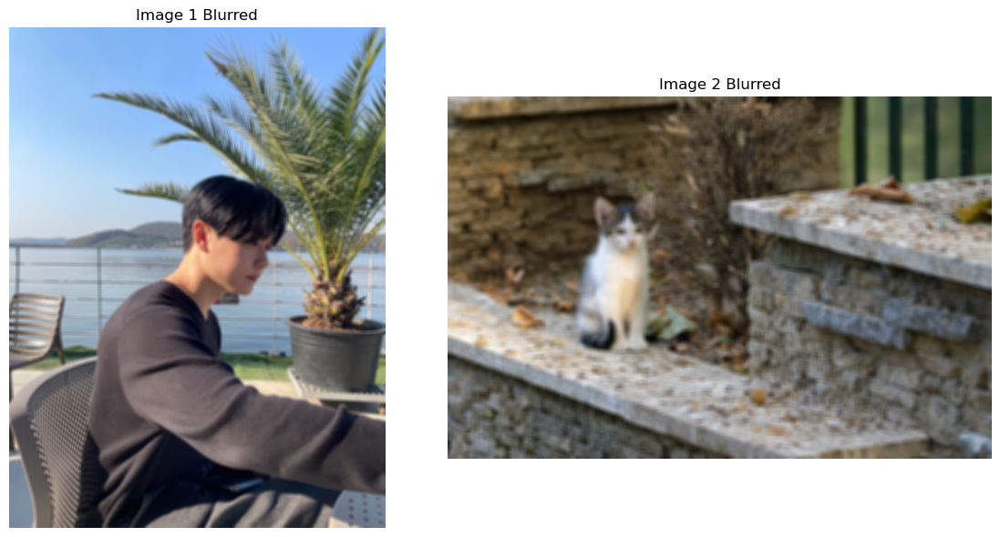

In [30]:
kernel_size = (20, 20)

# 1행 2열 subplot 생성
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# 첫 번째 이미지 블러 & 표시
img_blur1 = cv2.blur(img_orig, kernel_size)
axs[0].imshow(cv2.cvtColor(img_blur1, cv2.COLOR_BGR2RGB))
axs[0].set_title("Image 1 Blurred")
axs[0].axis('off')

# 두 번째 이미지 블러 & 표시
img_blur2 = cv2.blur(img_orig2, kernel_size)
axs[1].imshow(cv2.cvtColor(img_blur2, cv2.COLOR_BGR2RGB))
axs[1].set_title("Image 2 Blurred")
axs[1].axis('off')

plt.tight_layout()
plt.show()

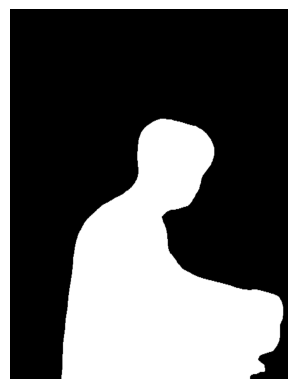

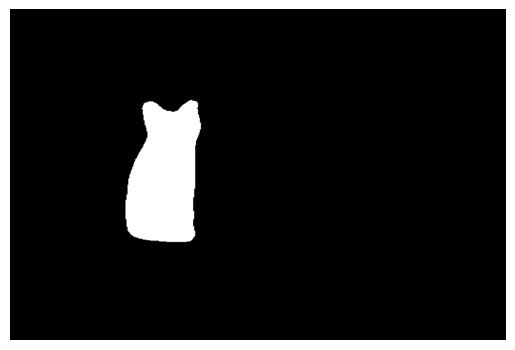

In [35]:
# 전경: fg_masks_gray (0/255)
# 3채널 전환: fg_masks_bgr
# 배경 마스크: bg_masks (255:blur, 0:foreground)
fg_masks_gray = []
fg_masks_bgr  = []
bg_masks      = []

for mask, cls in zip(masks, class_ids):
    fg_gray     = (mask == cls).astype(np.uint8) * 255
    fg_bgr      = cv2.cvtColor(fg_gray, cv2.COLOR_GRAY2BGR)
    bg_mask     = cv2.bitwise_not(fg_bgr)
    fg_masks_gray.append(fg_gray)
    fg_masks_bgr.append(fg_bgr)
    bg_masks.append(bg_mask)

# 확인 (예: 두 번째 전경 마스크 보기)
plt.imshow(fg_masks_gray[0], cmap='gray'); plt.axis('off'); plt.show()
plt.imshow(fg_masks_gray[1], cmap='gray'); plt.axis('off'); plt.show()

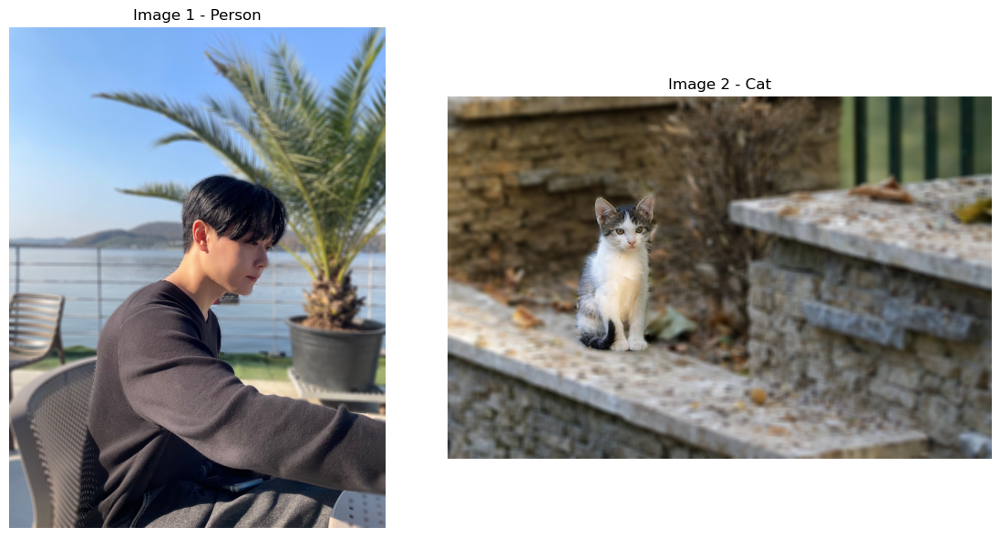

In [32]:
masks      = preds_resized[:2]
class_ids2 = class_ids[:2]

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

for i, (orig, mask, cls_id) in enumerate(zip(orig_imgs, masks, class_ids2)):
    # a) 전체 이미지 블러
    img_blur     = cv2.blur(orig, kernel_size)

    # b) 전경 마스크 (0/255) 및 3채널 변환
    fg_mask_gray = (mask == cls_id).astype(np.uint8) * 255
    fg_mask_bgr  = cv2.cvtColor(fg_mask_gray, cv2.COLOR_GRAY2BGR)

    # c) 배경 마스크 (전경 반전)
    bg_mask      = cv2.bitwise_not(fg_mask_bgr)

    # d) 배경 블러만 추출
    bg_only      = cv2.bitwise_and(img_blur, bg_mask)

    # e) 전경(사람/고양이)만 원본에서 추출
    fg_only      = cv2.bitwise_and(orig, fg_mask_bgr)

    # f) 블러된 배경 + 원본 전경 합성
    composite    = cv2.add(bg_only, fg_only)

    # g) Matplotlib에 표시 (BGR→RGB)
    axs[i].imshow(cv2.cvtColor(composite, cv2.COLOR_BGR2RGB))
    title = "Person" if cls_id == 15 else "Cat"
    axs[i].set_title(f"Image {i+1} - {title}")
    axs[i].axis('off')

plt.tight_layout()
plt.show()

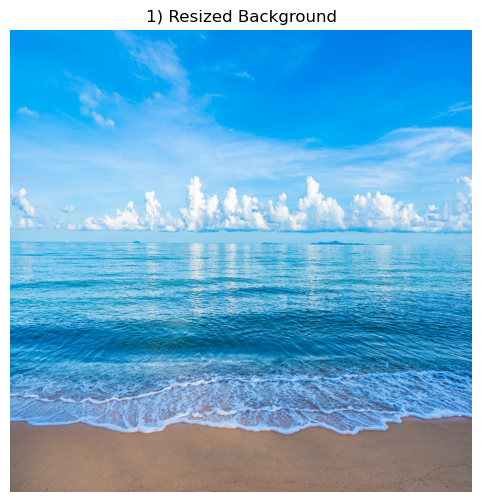

In [43]:
bg_path  = os.path.join(home_dir, "work/human_segmentation/images/sea.jpg")
new_bg   = cv2.imread(bg_path)
if new_bg is None:
    raise FileNotFoundError(f"배경 이미지가 없습니다: {bg_path}")

# 1-2) 3번 원본 이미지 크기로 리사이즈
# (이전 셀에서 orig_imgs = [img1, img2, img3] 로 정의되어 있어야 합니다)
h, w               = orig_imgs[2].shape[:2]
new_bg_resized     = cv2.resize(new_bg, (w, h), interpolation=cv2.INTER_AREA)

# 1-3) 결과 확인
plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(new_bg_resized, cv2.COLOR_BGR2RGB))
plt.title("1) Resized Background")
plt.axis("off")
plt.show()

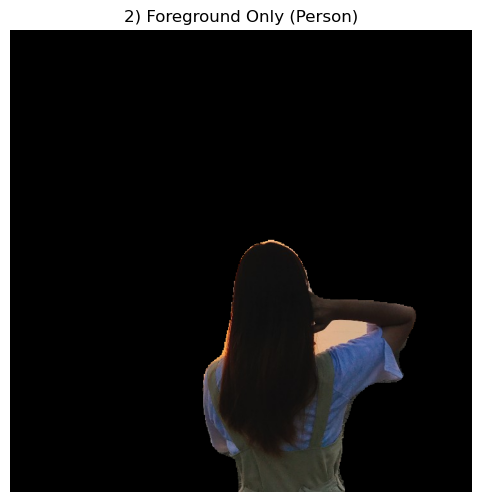

In [42]:
# 2-1) 3번 마스크에서 사람(person=class_ids[2])만 골라 0/255 그레이스케일
mask3_gray = (preds_resized[2] == class_ids[2]).astype(np.uint8) * 255

# 2-2) 그레이→BGR 채널 확장
mask3_bgr  = cv2.cvtColor(mask3_gray, cv2.COLOR_GRAY2BGR)

# 2-3) 원본 3번 이미지(orig_imgs[2])에서 전경(사람)만 추출
fg_only    = cv2.bitwise_and(orig_imgs[2], mask3_bgr)

# 2-4) 결과 확인
plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(fg_only, cv2.COLOR_BGR2RGB))
plt.title("2) Foreground Only (Person)")
plt.axis("off")
plt.show()

In [54]:
bg_mask  = cv2.bitwise_not(mask3_bgr)

# 3-2) 블러된 새 배경(new_bg_resized)에서 배경 영역만 추출
bg_only  = cv2.bitwise_and(new_bg_resized, bg_mask)

# 3-3) 전경(fg_only) + 블러된 배경(bg_only) 합성
composite = cv2.add(bg_only, fg_only)

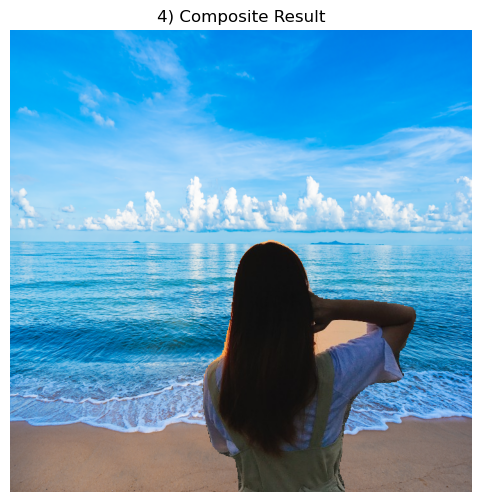

In [45]:
plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(composite, cv2.COLOR_BGR2RGB))
plt.title("4) Composite Result")
plt.axis("off")
plt.show()

In [ ]:
# 문제점 1 : 팔 사이 공간이 이미지 마스크에서 객체로 인식
# 문제점 2 : 전경(사람)의 톤과 바다의 톤 대비가 심하다

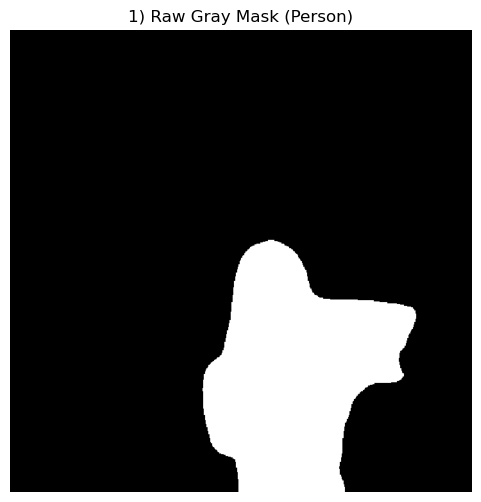

In [47]:
mask_gray = (preds_resized[2] == class_ids[2]).astype(np.uint8) * 255

plt.figure(figsize=(6,6))
plt.imshow(mask_gray, cmap='gray')
plt.title("1) Raw Gray Mask (Person)")
plt.axis('off')
plt.show()

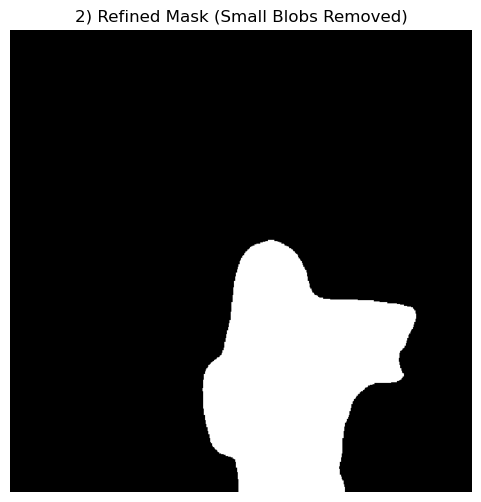

In [61]:
contours, _    = cv2.findContours(mask_gray,
                                  cv2.RETR_EXTERNAL,
                                  cv2.CHAIN_APPROX_SIMPLE)
# 2-2) 넓이 기준 필터링 (area_thresh 보다 큰 것만 남김)
area_thresh   = 70000   # 필요에 따라 조절하세요
mask_refined  = np.zeros_like(mask_gray)
for cnt in contours:
    if cv2.contourArea(cnt) > area_thresh:
        cv2.drawContours(mask_refined, [cnt], -1, 255, thickness=cv2.FILLED)

plt.figure(figsize=(6,6))
plt.imshow(mask_refined, cmap='gray')
plt.title("2) Refined Mask (Small Blobs Removed)")
plt.axis('off')
plt.show()

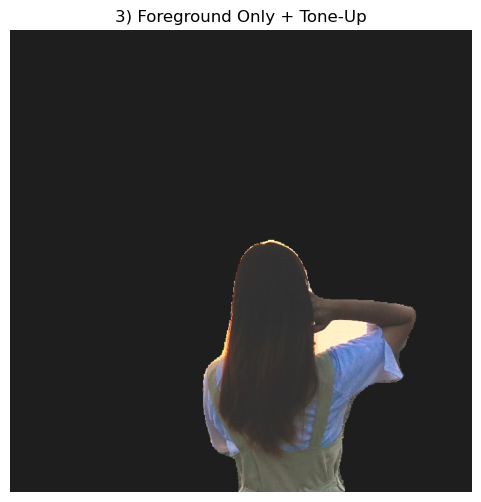

In [62]:
mask_bgr       = cv2.cvtColor(mask_refined, cv2.COLOR_GRAY2BGR)

# 3-2) 전경만 잘라내기
fg_only        = cv2.bitwise_and(orig_imgs[2], mask_bgr)

# 3-3) 톤업: 대비 약간 올리고(b=30), 밝기 강화(α=1.2)
fg_toned       = cv2.convertScaleAbs(fg_only, alpha=1.2, beta=30)

plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(fg_toned, cv2.COLOR_BGR2RGB))
plt.title("3) Foreground Only + Tone‑Up")
plt.axis('off')
plt.show()

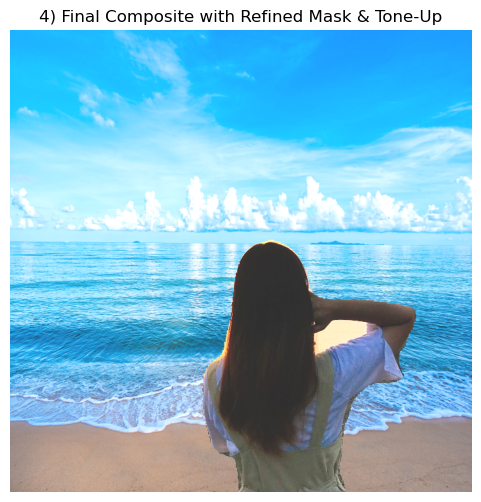

In [63]:
# 4-1) 배경 마스크 (전경 반전)
bg_mask        = cv2.bitwise_not(mask_bgr)

# 4-2) 새 배경에서 배경 부분만
bg_only_new    = cv2.bitwise_and(new_bg_resized, bg_mask)

# 4-3) 톤업된 전경 + 새 배경 합성
final_comp     = cv2.add(bg_only_new, fg_toned)

plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(final_comp, cv2.COLOR_BGR2RGB))
plt.title("4) Final Composite with Refined Mask & Tone‑Up")
plt.axis('off')
plt.show()

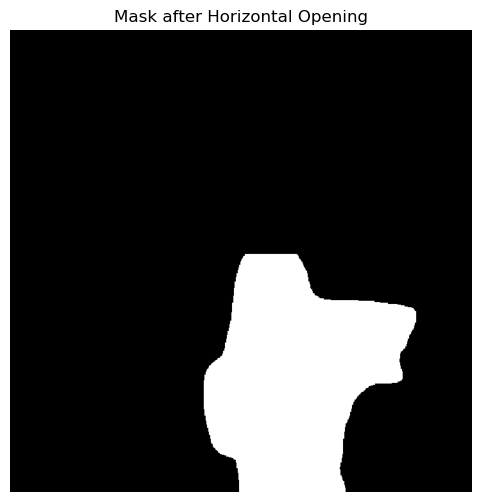

In [71]:
# 1) 원본 mask_gray: 0/255 그레이스케일
mask_gray = (preds_resized[2] == class_ids[2]).astype(np.uint8) * 255

# 2) 수평 Opening 커널: (너비, 높이)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (80, 10))

# 3) Opening → 얇은 연결부(머리-어깨 사이) 제거
mask_open = cv2.morphologyEx(mask_gray, cv2.MORPH_OPEN, kernel)

# 4) 결과 시각화
plt.figure(figsize=(6,6))
plt.imshow(mask_open, cmap='gray')
plt.title("Mask after Horizontal Opening")
plt.axis('off')
plt.show()

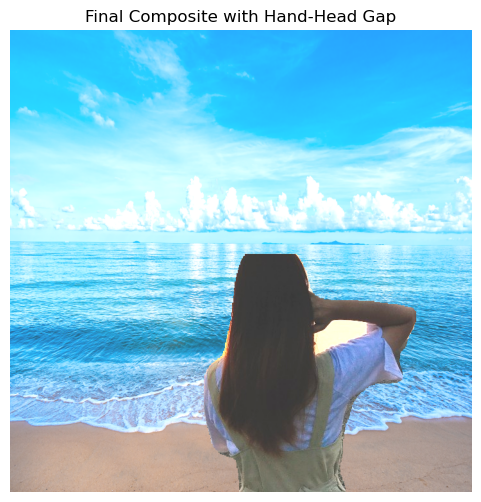

In [72]:
# A) 3채널 마스크
mask_bgr  = cv2.cvtColor(mask_open, cv2.COLOR_GRAY2BGR)

# B) 전경 & 톤업
fg_only   = cv2.bitwise_and(orig_imgs[2], mask_bgr)
fg_toned  = cv2.convertScaleAbs(fg_only, alpha=1.3, beta=40)

# C) 배경 마스크 & 새 배경 추출
bg_mask   = cv2.bitwise_not(mask_bgr)
bg_only   = cv2.bitwise_and(new_bg_resized, bg_mask)

# D) 합성
final = cv2.add(bg_only, fg_toned)

# E) 시각화
plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(final, cv2.COLOR_BGR2RGB))
plt.title("Final Composite with Hand‑Head Gap")
plt.axis('off')
plt.show()

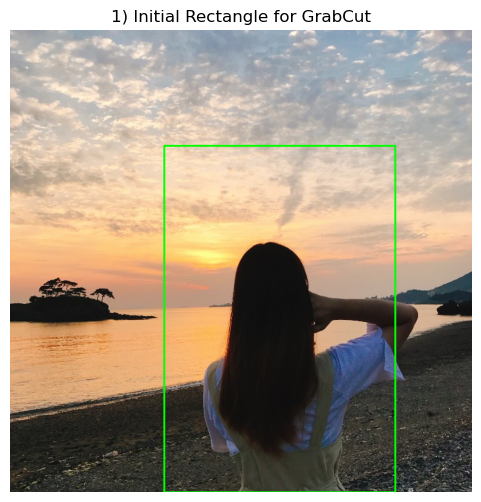

In [78]:
img = orig_imgs[2]  # 이제부터 'img' 로 통일

# 1-2) GrabCut용 초기 마스크
#    0=배경, 1=전경, 2=외부 배경, 3=외부 전경
mask_gc = np.zeros(img.shape[:2], dtype=np.uint8)

# 1-3) 대략적인 전경 영역을 감싸는 rect 지정
h, w    = img.shape[:2]
rect    = (w//3, h//4, w//2, 3*h//4)

# 1-4) 초기 사각형 시각화
img_rect = img.copy()
x, y, ww, hh = rect
cv2.rectangle(img_rect, (x,y), (x+ww, y+hh), (0,255,0), 2)

plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(img_rect, cv2.COLOR_BGR2RGB))
plt.title("1) Initial Rectangle for GrabCut")
plt.axis('off')
plt.show()

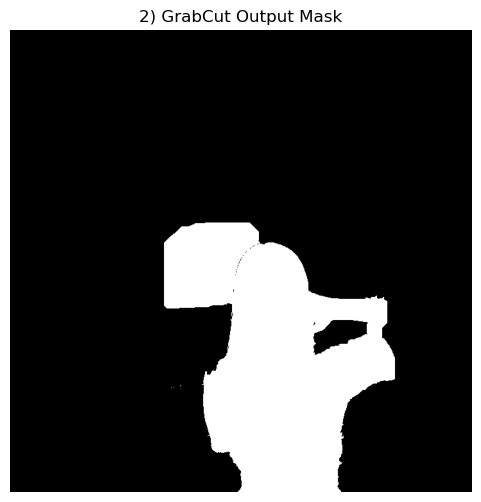

In [79]:
# 2-1) 배경 모델 / 전경 모델 초기화
bgdModel = np.zeros((1,65), np.float64)
fgdModel = np.zeros((1,65), np.float64)

# 2-2) GrabCut 수행
#       cv2.GC_INIT_WITH_RECT: rect 내부를 전경으로, 외부를 배경으로 초기화
cv2.grabCut(
    img, mask_gc, rect,
    bgdModel, fgdModel,
    iterCount=5,
    mode=cv2.GC_INIT_WITH_RECT
)

# 2-3) mask_gc 값 중 0,2를 배경, 1,3을 전경으로 재분류
mask2 = np.where(
    (mask_gc==cv2.GC_BGD) | (mask_gc==cv2.GC_PR_BGD),
    0, 1
).astype('uint8') * 255

plt.figure(figsize=(6,6))
plt.imshow(mask2, cmap='gray')
plt.title("2) GrabCut Output Mask")
plt.axis('off')
plt.show()


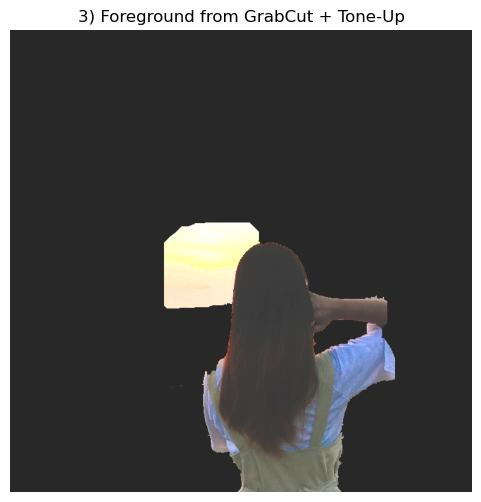

In [80]:
# 3-1) 3채널 마스크
mask_gc_bgr = cv2.cvtColor(mask2, cv2.COLOR_GRAY2BGR)

# 3-2) 전경(사람)만 뽑아서 톤업
fg_gc      = cv2.bitwise_and(img, mask_gc_bgr)
fg_gc_tone = cv2.convertScaleAbs(fg_gc, alpha=1.3, beta=40)

plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(fg_gc_tone, cv2.COLOR_BGR2RGB))
plt.title("3) Foreground from GrabCut + Tone-Up")
plt.axis('off')
plt.show()


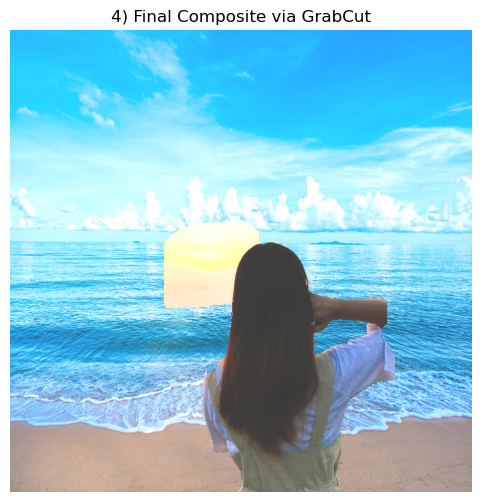

In [81]:
# 4-1) 배경 마스크 (전경 반전)
bg_gc_mask = cv2.bitwise_not(mask_gc_bgr)

# 4-2) 새 배경에서 배경 영역만
bg_gc_only = cv2.bitwise_and(new_bg_resized, bg_gc_mask)

# 4-3) 전경＋배경 합성
final_gc = cv2.add(bg_gc_only, fg_gc_tone)

plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(final_gc, cv2.COLOR_BGR2RGB))
plt.title("4) Final Composite via GrabCut")
plt.axis('off')
plt.show()


In [ ]:
# Review

1. 이미지에서 객체와 배경의 거리 등이 적당하다면 추출이 쉬웠다
2. 3번 이미지는 이미지의 객체(사람)의 팔 사이 부분이 객체로 인식되어 배경과 합쳐지지 않았다(어떤 방법을 써야할까?)
3. 핸드폰 기능을 활용한 합성이 아니라 수동작업을 통해 진행하니 신기했다